In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
import CococoNet_reader
from scipy import sparse


In [2]:
%config Completer.use_jedi = False


In [3]:
np.random.seed(401)

In [108]:
co_expressalog_map_85 = pd.read_csv('/data/passala/Generated_Tables/Maize_Rice_integration/true_pair_dataframe_default_settigns.csv')
co_expressalog_map_85

,Rice Gene,Maize Gene
0,Os01g0195400,Zm00001d008850
1,Os05g0199100,Zm00001d037751
2,Os01g0101600,Zm00001d008390
3,Os01g0256800,Zm00001d008326
4,Os01g0847100,Zm00001d042875
...,...,...
7652,BAC19863,GRMZM5G898647
7653,BAC19893,GRMZM5G867512
7654,BAC19869,GRMZM5G861791
7655,BAC19875,GRMZM5G804358


In [109]:
one_to_ones = pd.read_csv('/data/passala/Generated_Tables/Maize_Rice_integration/maize_rice_one_to_one.csv')
one_to_ones = one_to_ones[['maize','rice']]
one_to_ones = one_to_ones.rename(columns = {'maize':'Maize Gene','rice':'Rice Gene'})
one_to_ones

,Maize Gene,Rice Gene
0,Zm00001d008326,Os01g0256800
1,Zm00001d042875,Os01g0847100
2,Zm00001d039878,Os01g0144300
3,Zm00001d012590,Os01g0796400
4,Zm00001d042520,Os01g0897100
...,...,...
5466,GRMZM5G839924,BAC19900
5467,GRMZM5G889905,BAC19903
5468,Zm00001d040880,BAC19899
5469,GRMZM5G890451,BAC19857


In [110]:
co_expressalog_map_85.merge(on = ['Maize Gene','Rice Gene'], right = one_to_ones)

,Rice Gene,Maize Gene
0,Os01g0256800,Zm00001d008326
1,Os01g0847100,Zm00001d042875
2,Os01g0796400,Zm00001d012590
3,Os01g0897100,Zm00001d042520
4,Os01g0876400,Zm00001d042643
...,...,...
4327,BAC19863,GRMZM5G898647
4328,BAC19893,GRMZM5G867512
4329,BAC19869,GRMZM5G861791
4330,BAC19875,GRMZM5G804358


In [6]:
combined_matches = pd.concat([co_expressalog_map_85,one_to_ones],ignore_index = True)

In [7]:
co_expressalog_map_85 = combined_matches.drop_duplicates(keep = False)

In [8]:
co_expressalog_map_85 = co_expressalog_map_85.drop_duplicates(subset = 'Rice Gene')
co_expressalog_map_85 = co_expressalog_map_85.drop_duplicates(subset = 'Maize Gene')
co_expressalog_map_85

,Rice Gene,Maize Gene
0,Os01g0195400,Zm00001d008850
1,Os05g0199100,Zm00001d037751
2,Os01g0101600,Zm00001d008390
5,Os05g0566900,Zm00001d039041
8,Os05g0168800,Zm00001d009811
...,...,...
13122,BAC19860,GRMZM5G816772
13123,BAC19900,GRMZM5G839924
13124,BAC19903,GRMZM5G889905
13125,BAC19899,Zm00001d040880


In [9]:
maize_cccnt = CococoNet_reader.read_cococonet('maize')


In [10]:
rice_sc_data = sc.read_10x_mtx('/data/passala/Collaborator_Data/GEO_sourced_single_cell_for_CRUSH/Rice_japonica/Cell_ranger_results/Rice_paper/outs/filtered_feature_bc_matrix',cache=True)

In [11]:
maize_Data = sc.read_10x_mtx('/data/passala/Collaborator_Data/GEO_sourced_single_cell_for_CRUSH/Maize_nitrate_root_SC/Cell_ranger_output_folder/Full_output/cells_with_nitrate/outs/filtered_feature_bc_matrix', cache = True)

In [12]:
rice_sc_data.var

,gene_ids,feature_types
Os01g0100100,Os01g0100100,Gene Expression
Os01g0100200,Os01g0100200,Gene Expression
Os01g0100300,Os01g0100300,Gene Expression
Os01g0100400,Os01g0100400,Gene Expression
Os01g0100466,Os01g0100466,Gene Expression
...,...,...
Os12g0641200,Os12g0641200,Gene Expression
Os12g0641300,Os12g0641300,Gene Expression
Os12g0641400,Os12g0641400,Gene Expression
Os12g0641500,Os12g0641500,Gene Expression


In [13]:
maize_Data.var['In CoCoCoNet'] = 0
maize_Data.var['In CoCoCoNet'].loc[maize_Data.var['gene_ids'].isin(maize_cccnt.index)] = 1
#maize_Data = maize_Data[:,maize_Data.var['In CoCoCoNet'] == 1]
maize_Data

/tmp/ipykernel_1988199/898070478.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maize_Data.var['In CoCoCoNet'].loc[maize_Data.var['gene_ids'].isin(maize_cccnt.index)] = 1


AnnData object with n_obs × n_vars = 4101 × 46430
    var: 'gene_ids', 'feature_types', 'In CoCoCoNet'

In [14]:
sc.pp.filter_cells(maize_Data, min_genes=200)
sc.pp.filter_genes(maize_Data, min_cells=2)

In [15]:
maize_Data

AnnData object with n_obs × n_vars = 4100 × 25653
    obs: 'n_genes'
    var: 'gene_ids', 'feature_types', 'In CoCoCoNet', 'n_cells'

In [16]:
sc.pp.normalize_total(maize_Data, target_sum=1e4)
sc.pp.log1p(maize_Data)


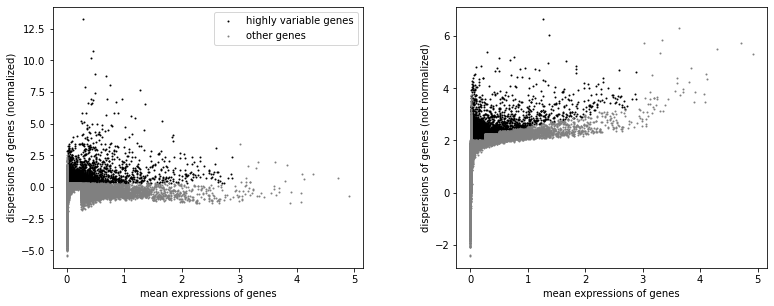

In [17]:

sc.pp.highly_variable_genes(maize_Data, min_mean=0.0125, max_mean=3, min_disp=0.3) # disp .5
sc.pl.highly_variable_genes(maize_Data)

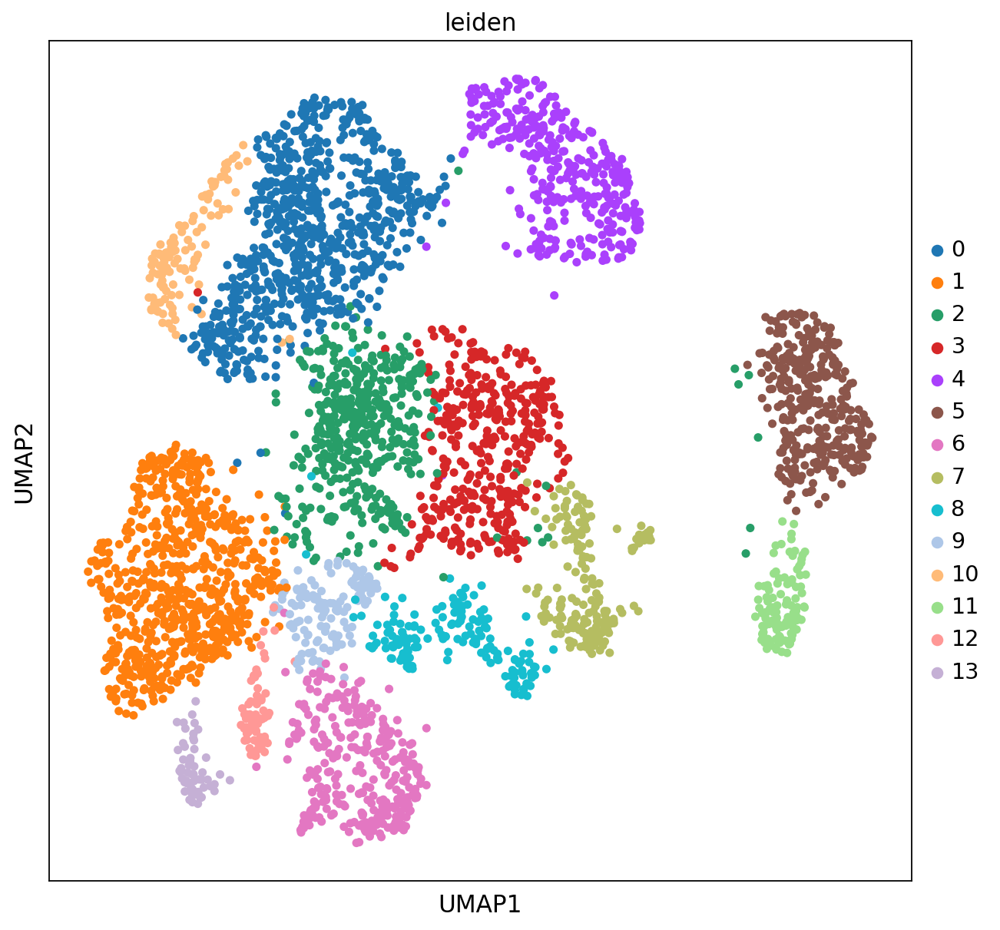

In [18]:
sc.set_figure_params(facecolor = 'white', figsize = (9,9))
sc.tl.pca(maize_Data, svd_solver='arpack', random_state= 200)
sc.pp.neighbors(maize_Data, n_neighbors=30, n_pcs=50, random_state= 500)
sc.tl.umap(maize_Data, random_state= 221)
sc.tl.leiden(maize_Data, random_state= 1000, resolution= .6)

sc.pl.umap(maize_Data, color = 'leiden', s=100)

In [19]:
maize_Data.var

,gene_ids,feature_types,In CoCoCoNet,n_cells,highly_variable,means,dispersions,dispersions_norm
Zm00001d027230,Zm00001d027230,Gene Expression,0,67,False,0.024387,1.696221,-0.095275
Zm00001d027231,Zm00001d027231,Gene Expression,1,290,True,0.241811,2.104409,0.435565
Zm00001d027233,Zm00001d027233,Gene Expression,1,2,False,0.000593,0.203313,-2.036773
Zm00001d027236,Zm00001d027236,Gene Expression,1,36,True,0.021745,2.032777,0.342410
Zm00001d027239,Zm00001d027239,Gene Expression,1,60,False,0.023626,1.419417,-0.455253
...,...,...,...,...,...,...,...,...
SSU_rRNA_eukarya-106,ENSRNA049478534,Gene Expression,1,67,True,0.090445,2.502171,0.952848
5_8S_rRNA-57,ENSRNA049478548,Gene Expression,0,8,False,0.010975,2.160190,0.508108
SSU_rRNA_eukarya-107,ENSRNA049478530,Gene Expression,1,217,True,0.307557,2.541439,1.507421
OVATE-transcription factor 3,Zm00001d000458,Gene Expression,0,2,False,0.000167,-0.994376,-3.594344


In [20]:
#sc.pl.umap(maize_Data, color = ['leiden','Zm00001d024960'], s=80, legend_loc = 'on data')# Epidermis

In [21]:
#sc.pl.umap(maize_Data, color = ['leiden','Zm00001d038325'], s=80, legend_loc = 'on data')# Epidermis

In [22]:
#sc.pl.umap(maize_Data, color = ['leiden','Zm00001d040257'], s=80, legend_loc = 'on data')# stele

In [23]:
#sc.pl.umap(maize_Data, color = ['leiden','Zm00001d018029'], s=80, legend_loc = 'on data')# endodermis

In [24]:
maize_Data.obs['Cell Cluster Annotation'] = 'Not Annotated'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '5'] = 'Epidermis'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['0','2','3','10'])] = 'Cortex'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['1'])] = 'Stele'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['4'])] = 'Exodermis'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['6'])] = 'CC'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['7'])] = 'Meristem'

maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['9'])] = 'Pericycle'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['11'])] = 'Root Hair'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['12'])] = 'Endodermis'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['13'])] = 'Protophloem'




/tmp/ipykernel_1988199/1510908982.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '5'] = 'Epidermis'
/tmp/ipykernel_1988199/1510908982.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['0','2','3','10'])] = 'Cortex'
/tmp/ipykernel_1988199/1510908982.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

In [25]:
rice_sc_data.var_names_make_unique()

In [26]:
rice_sc_data.var_names

Index(['Os01g0100100', 'Os01g0100200', 'Os01g0100300', 'Os01g0100400',
       'Os01g0100466', 'Os01g0100500', 'Os01g0100600', 'Os01g0100650',
       'Os01g0100700', 'Os01g0100800',
       ...
       'Os12g0640800', 'Os12g0640900', 'Os12g0640951', 'Os12g0640950',
       'Os12g0641100', 'Os12g0641200', 'Os12g0641300', 'Os12g0641400',
       'Os12g0641500', 'Os12g0641600'],
      dtype='object', length=37863)

In [27]:
sc.pp.normalize_total(rice_sc_data, target_sum=1e4)

sc.pp.log1p(rice_sc_data)

In [28]:
sc.pp.highly_variable_genes(rice_sc_data, min_mean=0.0125, max_mean=3, min_disp=.2)
#dispersion .5

In [29]:
sc.set_figure_params(facecolor = 'white', figsize = (9,9)) # Make figures bigger and on a white background because your PI is 70 and doesn't know what a .png is


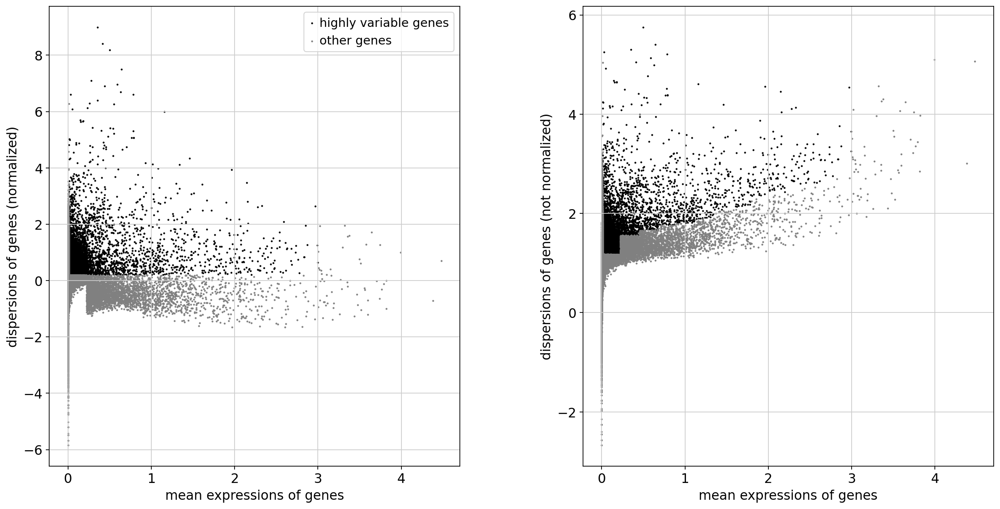

In [30]:
sc.pl.highly_variable_genes(rice_sc_data)


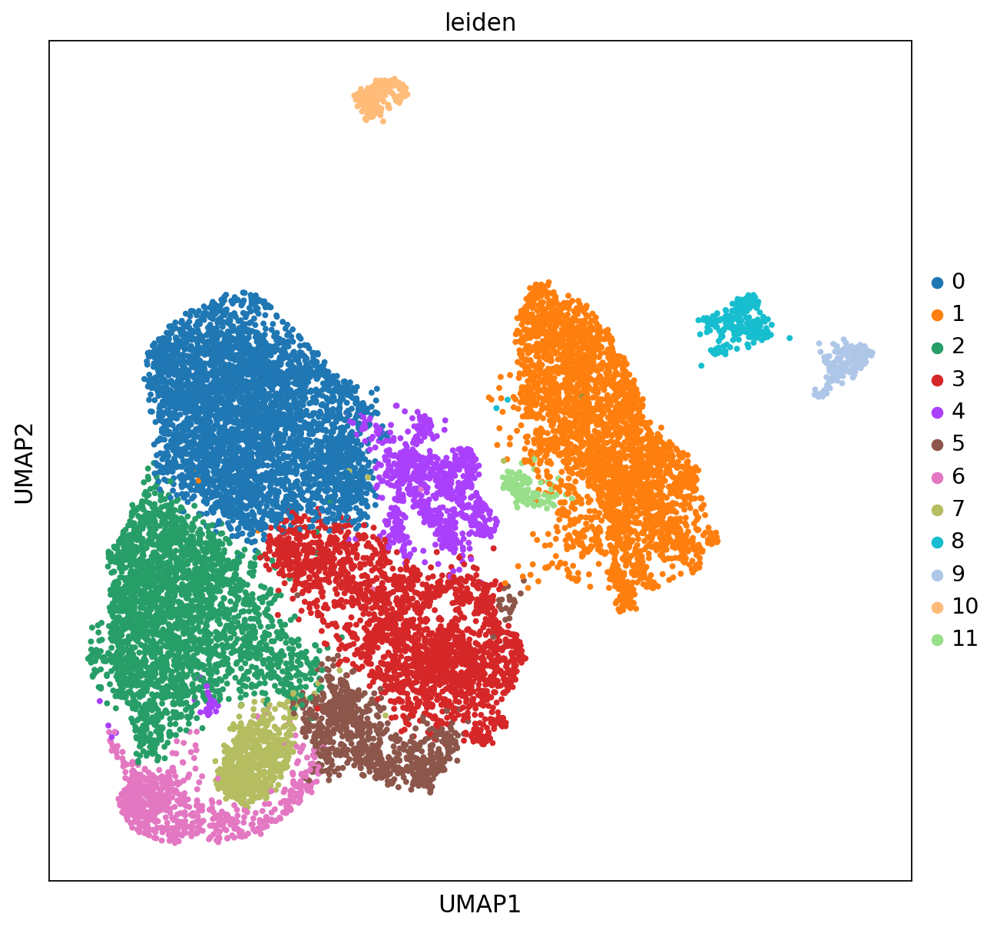

In [31]:
sc.tl.pca(rice_sc_data, svd_solver='arpack', random_state= 3456)
sc.pp.neighbors(rice_sc_data, n_neighbors=30, n_pcs=50, random_state= 112) ##30,50 # 25,45
sc.tl.umap(rice_sc_data, random_state= 649)
sc.tl.leiden(rice_sc_data, random_state= 823, resolution= .5)

sc.pl.umap(rice_sc_data, color = 'leiden', s=50,)

In [32]:
marker_genes = pd.read_csv('/home/passala/git/Coexpressalog_Method_Development/rice_maize_data/marker_genes.csv', sep= '\t')
#marker_genes['Gene ID'] =marker_genes['Gene ID'].str.split('-').str[1]
#marker_genes['Gene ID'] =marker_genes['Gene ID'].str[:5]+'0'+marker_genes['Gene ID'].str[5:]+'0'
marker_genes

,Gene ID,P value,avg_log(Foldchange),pct.1 (enriched cluster),pct.2 (other clusters),adjusted P value,cluster
0,LOC-Os02g44310,0.000000e+00,1.648360,0.999,0.977,0.000000e+00,cortex
1,LOC-Os06g13680,0.000000e+00,0.630611,0.999,0.998,0.000000e+00,cortex
2,LOC-Os07g34589,0.000000e+00,0.597807,0.999,0.993,0.000000e+00,cortex
3,LOC-Os01g21120,0.000000e+00,0.462817,0.999,0.991,0.000000e+00,cortex
4,LOC-Os04g33110,0.000000e+00,0.756632,0.996,0.985,0.000000e+00,cortex
...,...,...,...,...,...,...,...
6536,LOC-Os05g19600,4.260000e-23,0.312931,0.176,0.102,1.670000e-18,stele
6537,LOC-Os03g26460,1.500000e-21,0.271316,0.433,0.344,5.890000e-17,stele
6538,LOC-Os06g35560,4.780000e-20,0.255126,0.600,0.498,1.870000e-15,stele
6539,LOC-Os01g52010,1.400000e-14,0.294384,0.302,0.243,5.500000e-10,stele


In [33]:
gene_convertor_for_rice = pd.read_csv('/data/passala/Collaborator_Data/GEO_sourced_single_cell_for_CRUSH/Rice_japonica/genome_conversion/cleaned_conversion_with_duplicates.csv')


In [34]:
merged_marker_genes = marker_genes.merge(how = 'left', right= gene_convertor_for_rice, left_on= 'Gene ID', right_on= 'MSU Format',)
merged_marker_genes

,Gene ID,P value,avg_log(Foldchange),pct.1 (enriched cluster),pct.2 (other clusters),adjusted P value,cluster,RAP Format,MSU Format
0,LOC-Os02g44310,0.000000e+00,1.648360,0.999,0.977,0.000000e+00,cortex,Os02g0662000,LOC-Os02g44310
1,LOC-Os06g13680,0.000000e+00,0.630611,0.999,0.998,0.000000e+00,cortex,Os06g0246000,LOC-Os06g13680
2,LOC-Os07g34589,0.000000e+00,0.597807,0.999,0.993,0.000000e+00,cortex,Os07g0529800,LOC-Os07g34589
3,LOC-Os01g21120,0.000000e+00,0.462817,0.999,0.991,0.000000e+00,cortex,Os01g0313300,LOC-Os01g21120
4,LOC-Os04g33110,0.000000e+00,0.756632,0.996,0.985,0.000000e+00,cortex,Os04g0403900,LOC-Os04g33110
...,...,...,...,...,...,...,...,...,...
6612,LOC-Os05g19600,4.260000e-23,0.312931,0.176,0.102,1.670000e-18,stele,Os05g0277000,LOC-Os05g19600
6613,LOC-Os03g26460,1.500000e-21,0.271316,0.433,0.344,5.890000e-17,stele,Os03g0381300,LOC-Os03g26460
6614,LOC-Os06g35560,4.780000e-20,0.255126,0.600,0.498,1.870000e-15,stele,Os06g0548200,LOC-Os06g35560
6615,LOC-Os01g52010,1.400000e-14,0.294384,0.302,0.243,5.500000e-10,stele,Os01g0717700,LOC-Os01g52010


In [35]:
rice_sc_data.var_names_make_unique()

In [36]:
merged_marker_genes.loc[merged_marker_genes['Gene ID'].isin(['LOC-Os05g39960'])]

,Gene ID,P value,avg_log(Foldchange),pct.1 (enriched cluster),pct.2 (other clusters),adjusted P value,cluster,RAP Format,MSU Format
920,LOC-Os05g39960,8.070000e-256,2.804204,1.0,0.306,3.160000e-251,endodermis,Os05g0477300,LOC-Os05g39960


In [37]:
merged_marker_genes.loc[merged_marker_genes['RAP Format'].isin(rice_sc_data.var.index)].loc[merged_marker_genes['cluster']=='stele'].head(20)

,Gene ID,P value,avg_log(Foldchange),pct.1 (enriched cluster),pct.2 (other clusters),adjusted P value,cluster,RAP Format,MSU Format
5981,LOC-Os01g18170,0.0,1.302331,1.000,0.966,0.0,stele,Os01g0284500,LOC-Os01g18170
5982,LOC-Os07g03279,0.0,0.787610,1.000,0.996,0.0,stele,Os07g0124900,LOC-Os07g03279
5983,LOC-Os01g25560,0.0,0.664794,0.999,0.966,0.0,stele,Os01g0358100,LOC-Os01g25560
5984,LOC-Os04g56100,0.0,0.624333,0.998,0.974,0.0,stele,Os04g0655100,LOC-Os04g56100
5985,LOC-Os04g47220,0.0,0.674268,0.997,0.968,0.0,stele,Os04g0559700,LOC-Os04g47220
5986,LOC-Os10g30790,0.0,0.590438,0.996,0.911,0.0,stele,Os10g0444700,LOC-Os10g30790
5987,LOC-Os11g42960,0.0,1.612527,0.994,0.430,0.0,stele,Os11g0649600,LOC-Os11g42960
5988,LOC-Os03g13140,0.0,0.911512,0.992,0.827,0.0,stele,Os03g0233900,LOC-Os03g13140
5989,LOC-Os10g28050,0.0,0.713794,0.992,0.779,0.0,stele,Os10g0416100,LOC-Os10g28050
5990,LOC-Os03g51080,0.0,0.492899,0.992,0.930,0.0,stele,Os03g0720300,LOC-Os03g51080


In [38]:
#sc.pl.umap(rice_sc_data, color = ['leiden','Os05g0477300'], s=50, legend_loc = 'on data')# endodermis

In [39]:
#sc.pl.umap(rice_sc_data, color = ['leiden','Os03g0223400'], s=50, legend_loc = 'on data')# epi near root hair

In [40]:
#sc.pl.umap(rice_sc_data, color = ['leiden','Os05g0246300'], s=50, legend_loc = 'on data')# root cap

In [41]:
#sc.pl.umap(rice_sc_data, color = ['leiden','Os07g0104100'], s=50, legend_loc = 'on data')# metaxylem

In [42]:
#sc.pl.umap(rice_sc_data, color = ['leiden','Os07g0174900'], s=50, legend_loc = 'on data')# stele

In [43]:
#sc.pl.umap(rice_sc_data, color = ['leiden','Os06g0335900'], s=50, legend_loc = 'on data') ## root hair

In [44]:
#sc.pl.umap(rice_sc_data, color = ['leiden','Os07g0529800'], s=50, legend_loc = 'on data') # cortex

In [45]:
#sc.pl.umap(rice_sc_data, color = ['leiden','Os12g0548401'], s=50, legend_loc = 'on data') # cortex

In [46]:
#sc.pl.umap(rice_sc_data, color = ['leiden','Os01g0282800'], s=50, legend_loc = 'on data') ## epidermiks

In [47]:
#sc.pl.umap(rice_sc_data, color = ['leiden','Os01g72340'], s=50, legend_loc = 'on data') # cortex

In [48]:
rice_sc_data.var

,gene_ids,feature_types,highly_variable,means,dispersions,dispersions_norm
Os01g0100100,Os01g0100100,Gene Expression,False,9.381453e-03,1.401757,0.553759
Os01g0100200,Os01g0100200,Gene Expression,False,4.067292e-02,0.994555,-0.085596
Os01g0100300,Os01g0100300,Gene Expression,False,4.735694e-04,0.386184,-1.040810
Os01g0100400,Os01g0100400,Gene Expression,False,4.003630e-03,0.607636,-0.693104
Os01g0100466,Os01g0100466,Gene Expression,False,1.000000e-12,NaN,0.000000
...,...,...,...,...,...,...
Os12g0641200,Os12g0641200,Gene Expression,False,1.339003e-02,0.937923,-0.174515
Os12g0641300,Os12g0641300,Gene Expression,False,1.637107e-02,0.751851,-0.466670
Os12g0641400,Os12g0641400,Gene Expression,True,4.142963e-01,1.574961,0.228052
Os12g0641500,Os12g0641500,Gene Expression,True,6.777357e-02,1.372489,0.507805


In [49]:
rice_sc_data.obs['Cell Cluster Annotation'] = 'Not Annotated'
rice_sc_data.obs['Cell Cluster Annotation'].loc[rice_sc_data.obs['leiden'].isin(['1','11'])] = 'Stele'
rice_sc_data.obs['Cell Cluster Annotation'].loc[rice_sc_data.obs['leiden'].isin(['0','3',])] = 'Cortex'
rice_sc_data.obs['Cell Cluster Annotation'].loc[rice_sc_data.obs['leiden'].isin(['2','5','6'])] = 'Epidermis'
rice_sc_data.obs['Cell Cluster Annotation'].loc[rice_sc_data.obs['leiden'].isin(['9'])] = 'Root Hair'

types_to_include_in_mapping = ['Epidermis','Cortex','Stele', 'Root Hair']

/tmp/ipykernel_1988199/2794517125.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rice_sc_data.obs['Cell Cluster Annotation'].loc[rice_sc_data.obs['leiden'].isin(['1','11'])] = 'Stele'
/tmp/ipykernel_1988199/2794517125.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rice_sc_data.obs['Cell Cluster Annotation'].loc[rice_sc_data.obs['leiden'].isin(['0','3',])] = 'Cortex'
/tmp/ipykernel_1988199/2794517125.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

In [50]:
sec_rice = rice_sc_data[rice_sc_data.obs.loc[rice_sc_data.obs['Cell Cluster Annotation'].isin(types_to_include_in_mapping)].index,:]
sec_rice

View of AnnData object with n_obs × n_vars = 13077 × 37863
    obs: 'leiden', 'Cell Cluster Annotation'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


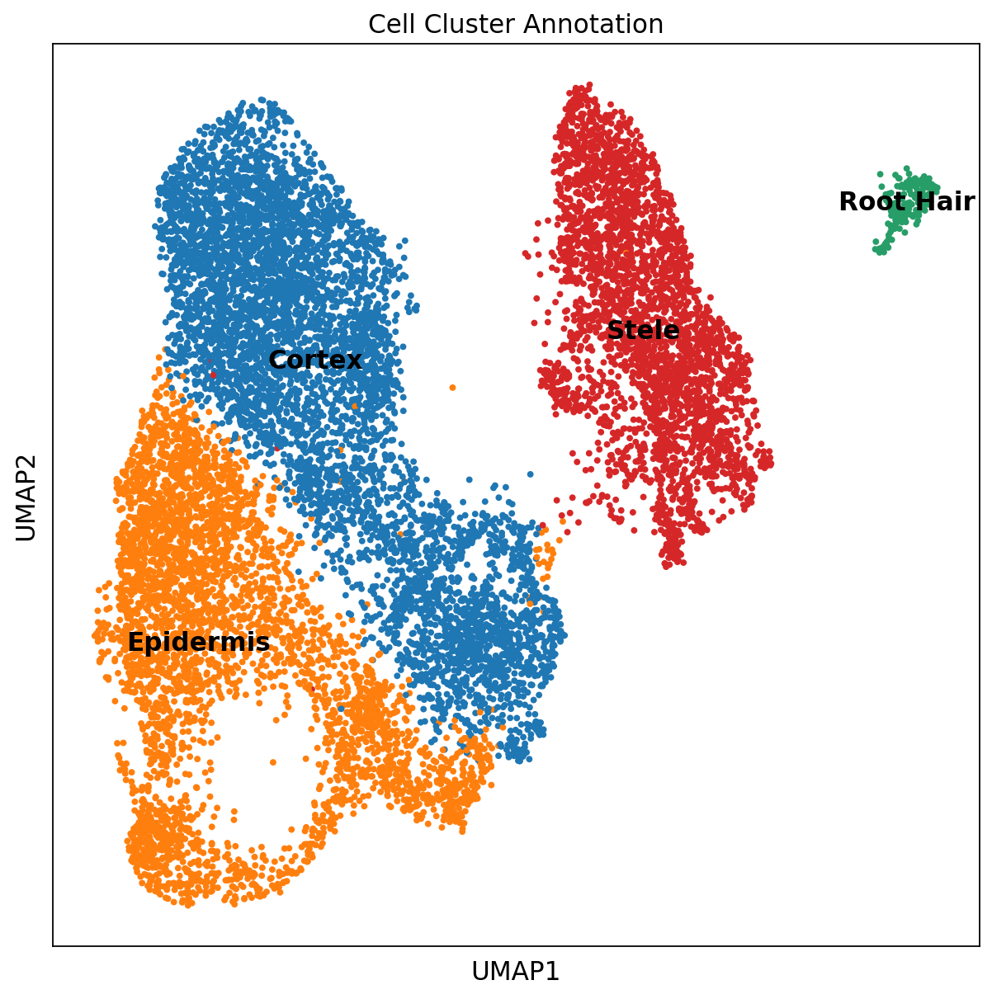

In [51]:
sc.pl.umap(sec_rice, color = ['Cell Cluster Annotation'], s=50, legend_loc = 'on data')

In [52]:
sec_maize = maize_Data[maize_Data.obs.loc[maize_Data.obs['Cell Cluster Annotation'].isin(types_to_include_in_mapping)].index,:]


In [53]:
sec_maize.obs.value_counts(subset = 'Cell Cluster Annotation')

Cell Cluster Annotation
Cortex       1719
Stele         677
Epidermis     329
Root Hair     107
dtype: int64

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


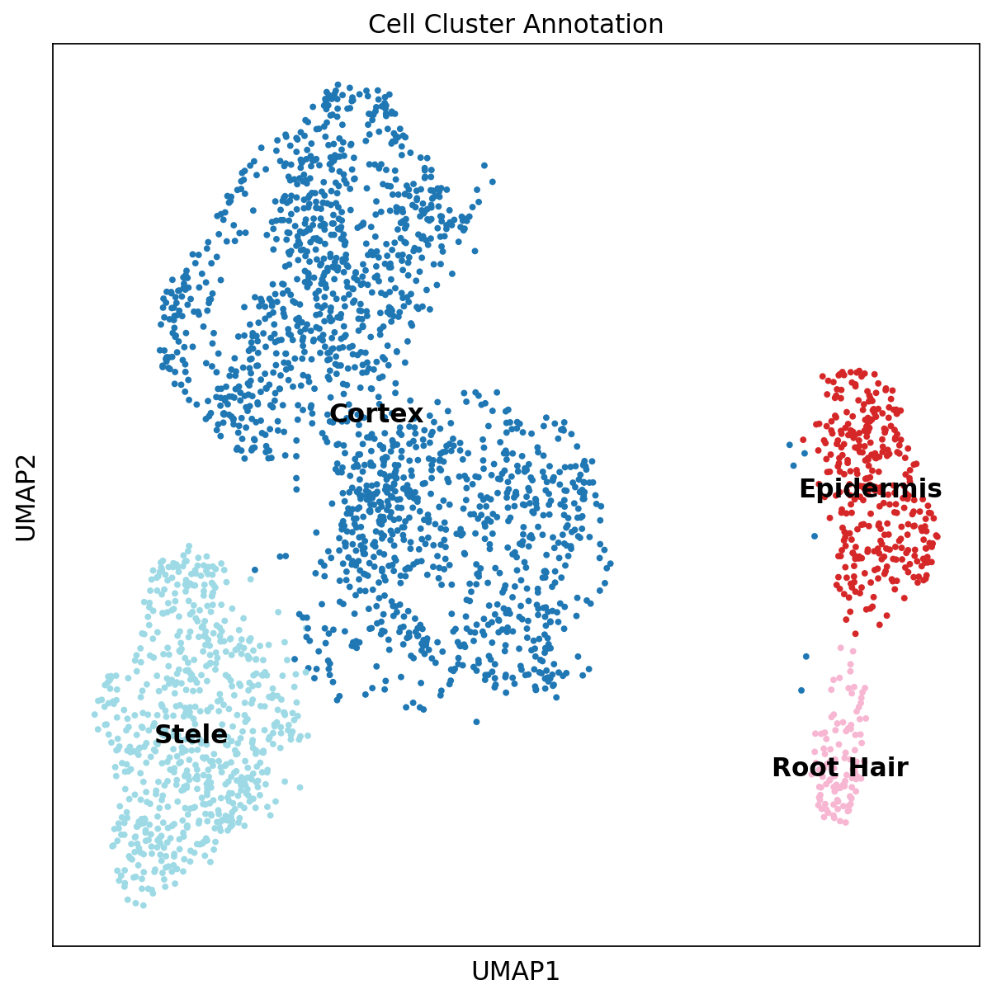

In [54]:
sc.pl.umap(sec_maize, color = ['Cell Cluster Annotation'],palette= 'tab20', s=50, legend_loc = 'on data')

In [55]:
sec_rice.var['Gene Name'] = sec_rice.var.index
sec_rice.var = sec_rice.var.rename(columns = {'Gene Name':'Gene ID'})
sec_rice.var = sec_rice.var.merge(right = co_expressalog_map_85, right_on = 'Rice Gene', how = 'left', left_on= 'Gene ID')
sec_rice.var

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


,gene_ids,feature_types,highly_variable,means,dispersions,dispersions_norm,Gene ID,Rice Gene,Maize Gene
0,Os01g0100100,Gene Expression,False,9.381453e-03,1.401757,0.553759,Os01g0100100,NaN,NaN
1,Os01g0100200,Gene Expression,False,4.067292e-02,0.994555,-0.085596,Os01g0100200,NaN,NaN
2,Os01g0100300,Gene Expression,False,4.735694e-04,0.386184,-1.040810,Os01g0100300,NaN,NaN
3,Os01g0100400,Gene Expression,False,4.003630e-03,0.607636,-0.693104,Os01g0100400,NaN,NaN
4,Os01g0100466,Gene Expression,False,1.000000e-12,NaN,0.000000,Os01g0100466,NaN,NaN
...,...,...,...,...,...,...,...,...,...
37858,Os12g0641200,Gene Expression,False,1.339003e-02,0.937923,-0.174515,Os12g0641200,NaN,NaN
37859,Os12g0641300,Gene Expression,False,1.637107e-02,0.751851,-0.466670,Os12g0641300,NaN,NaN
37860,Os12g0641400,Gene Expression,True,4.142963e-01,1.574961,0.228052,Os12g0641400,NaN,NaN
37861,Os12g0641500,Gene Expression,True,6.777357e-02,1.372489,0.507805,Os12g0641500,NaN,NaN


In [56]:
sec_rice.var = sec_rice.var.set_index('Gene ID')
sec_rice.var

,gene_ids,feature_types,highly_variable,means,dispersions,dispersions_norm,Rice Gene,Maize Gene
Gene ID,,,,,,,,
Os01g0100100,Os01g0100100,Gene Expression,False,9.381453e-03,1.401757,0.553759,NaN,NaN
Os01g0100200,Os01g0100200,Gene Expression,False,4.067292e-02,0.994555,-0.085596,NaN,NaN
Os01g0100300,Os01g0100300,Gene Expression,False,4.735694e-04,0.386184,-1.040810,NaN,NaN
Os01g0100400,Os01g0100400,Gene Expression,False,4.003630e-03,0.607636,-0.693104,NaN,NaN
Os01g0100466,Os01g0100466,Gene Expression,False,1.000000e-12,NaN,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...
Os12g0641200,Os12g0641200,Gene Expression,False,1.339003e-02,0.937923,-0.174515,NaN,NaN
Os12g0641300,Os12g0641300,Gene Expression,False,1.637107e-02,0.751851,-0.466670,NaN,NaN
Os12g0641400,Os12g0641400,Gene Expression,True,4.142963e-01,1.574961,0.228052,NaN,NaN


In [57]:
sec_maize.var = sec_maize.var.merge(right = co_expressalog_map_85, how = 'left', right_on= 'Maize Gene', left_on='gene_ids')
sec_maize.var

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


,gene_ids,feature_types,In CoCoCoNet,n_cells,highly_variable,means,dispersions,dispersions_norm,Rice Gene,Maize Gene
0,Zm00001d027230,Gene Expression,0,67,False,0.024387,1.696221,-0.095275,NaN,NaN
1,Zm00001d027231,Gene Expression,1,290,True,0.241811,2.104409,0.435565,NaN,NaN
2,Zm00001d027233,Gene Expression,1,2,False,0.000593,0.203313,-2.036773,NaN,NaN
3,Zm00001d027236,Gene Expression,1,36,True,0.021745,2.032777,0.342410,NaN,NaN
4,Zm00001d027239,Gene Expression,1,60,False,0.023626,1.419417,-0.455253,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
25648,ENSRNA049478534,Gene Expression,1,67,True,0.090445,2.502171,0.952848,NaN,NaN
25649,ENSRNA049478548,Gene Expression,0,8,False,0.010975,2.160190,0.508108,NaN,NaN
25650,ENSRNA049478530,Gene Expression,1,217,True,0.307557,2.541439,1.507421,NaN,NaN
25651,Zm00001d000458,Gene Expression,0,2,False,0.000167,-0.994376,-3.594344,NaN,NaN


In [58]:
sec_maize.obs.value_counts(subset = 'Cell Cluster Annotation')

Cell Cluster Annotation
Cortex       1719
Stele         677
Epidermis     329
Root Hair     107
dtype: int64

In [59]:
rice_var_names_with_ortholog = sec_rice.var.dropna().index
rice_version_of_maize_genes_with_ortholog = sec_maize.var.dropna()['Rice Gene'].to_list()

rice_var_names_with_ortholog
overlap_of_shared_genes = rice_var_names_with_ortholog.intersection(rice_version_of_maize_genes_with_ortholog)

maize_genes_to_keep = sec_maize.var.loc[sec_maize.var['Rice Gene'].isin(overlap_of_shared_genes)].index

In [60]:
sec_maize.var = sec_maize.var.set_index('gene_ids')


In [61]:
sec_maize

AnnData object with n_obs × n_vars = 2832 × 25653
    obs: 'n_genes', 'leiden', 'Cell Cluster Annotation'
    var: 'feature_types', 'In CoCoCoNet', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Rice Gene', 'Maize Gene'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [62]:
maize_single_cell_trimmed_to_orthologs = sec_maize[:,maize_genes_to_keep]
maize_single_cell_trimmed_to_orthologs

View of AnnData object with n_obs × n_vars = 2832 × 3789
    obs: 'n_genes', 'leiden', 'Cell Cluster Annotation'
    var: 'feature_types', 'In CoCoCoNet', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Rice Gene', 'Maize Gene'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [63]:
rice_genes_to_keep = sec_rice.var.loc[sec_rice.var['Rice Gene'].isin(overlap_of_shared_genes)].index

In [64]:
rice_genes_to_keep

Index(['Os01g0100600', 'Os01g0101600', 'Os01g0101800', 'Os01g0102500',
       'Os01g0103600', 'Os01g0103800', 'Os01g0104100', 'Os01g0104600',
       'Os01g0105900', 'Os01g0106300',
       ...
       'Os12g0623600', 'Os12g0626400', 'Os12g0628500', 'Os12g0629700',
       'Os12g0630500', 'Os12g0632600', 'Os12g0632700', 'Os12g0635500',
       'Os12g0638600', 'Os12g0640800'],
      dtype='object', name='Gene ID', length=3789)

In [65]:
rice_single_cell_slimmed_to_orthologs = sec_rice[:,rice_genes_to_keep]
rice_single_cell_slimmed_to_orthologs

View of AnnData object with n_obs × n_vars = 13077 × 3789
    obs: 'leiden', 'Cell Cluster Annotation'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Rice Gene', 'Maize Gene'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [66]:
maize_single_cell_trimmed_to_orthologs.var.index = maize_single_cell_trimmed_to_orthologs.var['Rice Gene'].to_list()
maize_single_cell_trimmed_to_orthologs.var

,feature_types,In CoCoCoNet,n_cells,highly_variable,means,dispersions,dispersions_norm,Rice Gene,Maize Gene
Os10g0561300,Gene Expression,1,34,False,0.009267,1.474556,-0.383545,Os10g0561300,Zm00001d027268
Os10g0560500,Gene Expression,0,35,True,0.025212,2.421622,0.848096,Os10g0560500,Zm00001d027277
Os08g0480100,Gene Expression,1,1948,False,1.526261,2.300201,-0.724204,Os08g0480100,Zm00001d027293
Os03g0105600,Gene Expression,1,102,True,0.065927,2.090421,0.417375,Os03g0105600,Zm00001d027295
Os03g0107400,Gene Expression,1,147,True,0.131311,2.017341,0.322336,Os03g0107400,Zm00001d027307
...,...,...,...,...,...,...,...,...,...
Os05g0497300,Gene Expression,1,368,False,0.278591,2.143566,-0.140355,Os05g0497300,Zm00001d000339
Os06g0203600,Gene Expression,1,433,False,0.264726,2.039809,-0.570061,Os06g0203600,Zm00001d000357
Os02g0732200,Gene Expression,1,243,True,0.295794,2.408281,0.955953,Os02g0732200,Zm00001d000381
Os06g0650600,Gene Expression,1,177,True,0.149739,2.224363,0.591564,Os06g0650600,Zm00001d000428


In [67]:
order_of_vars = rice_single_cell_slimmed_to_orthologs.var.index.to_list()
current_order_maize_vars = maize_single_cell_trimmed_to_orthologs.var_names
panda_version_of_maize_x_data = pd.DataFrame(columns = current_order_maize_vars, data = maize_single_cell_trimmed_to_orthologs.X.todense())
re_ordered_version = panda_version_of_maize_x_data.reindex(columns = order_of_vars)
re_ordered_version = sparse.csr_matrix(re_ordered_version.values)
maize_single_cell_trimmed_to_orthologs.X = re_ordered_version
maize_single_cell_trimmed_to_orthologs.var = maize_single_cell_trimmed_to_orthologs.var.reindex(order_of_vars)

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/scipy/sparse/_index.py:137: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [68]:
rice_single_cell_slimmed_to_orthologs.obs

,leiden,Cell Cluster Annotation
AAACCTGAGCTTTGGT-1,0,Cortex
AAACCTGAGGCTACGA-1,0,Cortex
AAACCTGAGTAGTGCG-1,1,Stele
AAACCTGAGTGTACGG-1,6,Epidermis
AAACCTGCAACTTGAC-1,1,Stele
...,...,...
TTTGTCATCAAACCAC-1,6,Epidermis
TTTGTCATCATTGCCC-1,3,Cortex
TTTGTCATCCCTTGTG-1,0,Cortex
TTTGTCATCGGTCCGA-1,1,Stele


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


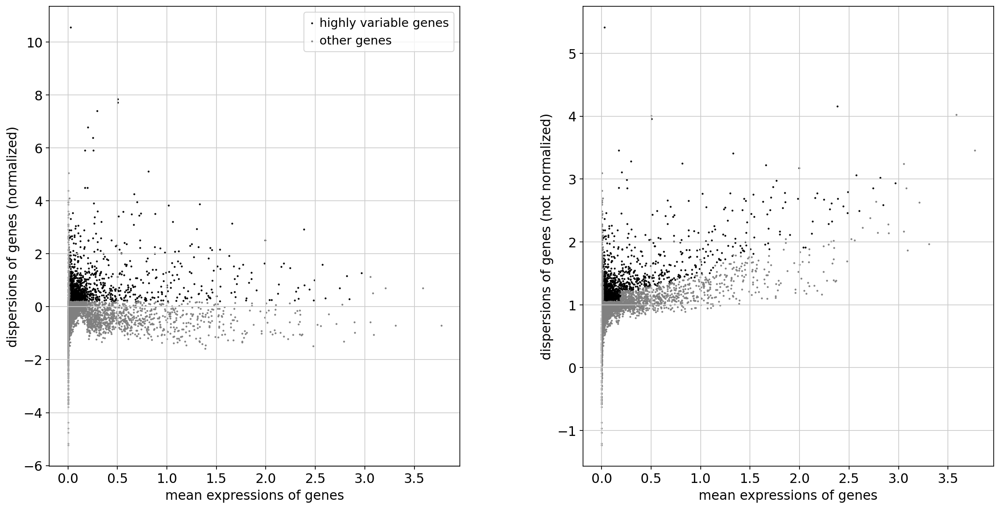

In [69]:
sc.pp.highly_variable_genes(rice_single_cell_slimmed_to_orthologs, min_mean=0.0125, max_mean=3, min_disp=.2)
sc.pl.highly_variable_genes(rice_single_cell_slimmed_to_orthologs)

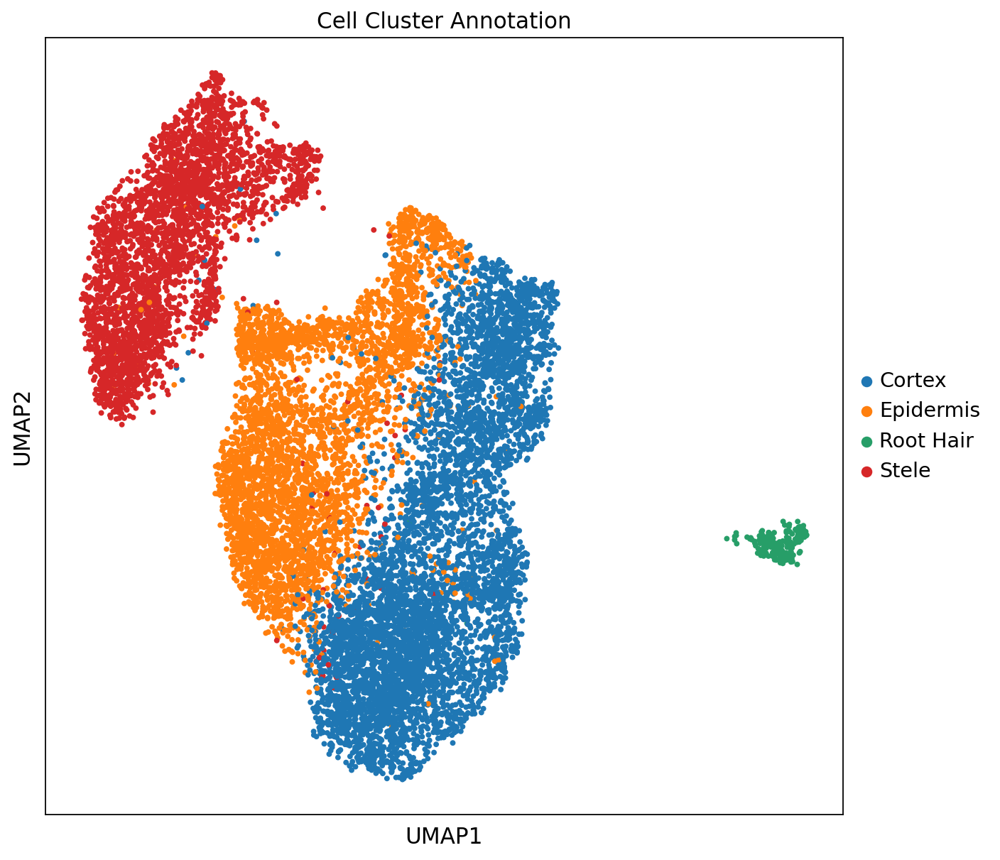

In [70]:
sc.tl.pca(rice_single_cell_slimmed_to_orthologs, svd_solver='arpack', random_state= 5463)
sc.pp.neighbors(rice_single_cell_slimmed_to_orthologs, n_neighbors=30, n_pcs=50, random_state= 2) ##30,50 # 25,45
sc.tl.umap(rice_single_cell_slimmed_to_orthologs, random_state= 897)
sc.tl.leiden(rice_single_cell_slimmed_to_orthologs, random_state= 345,)

sc.pl.umap(rice_single_cell_slimmed_to_orthologs, color = 'Cell Cluster Annotation', s=50,)

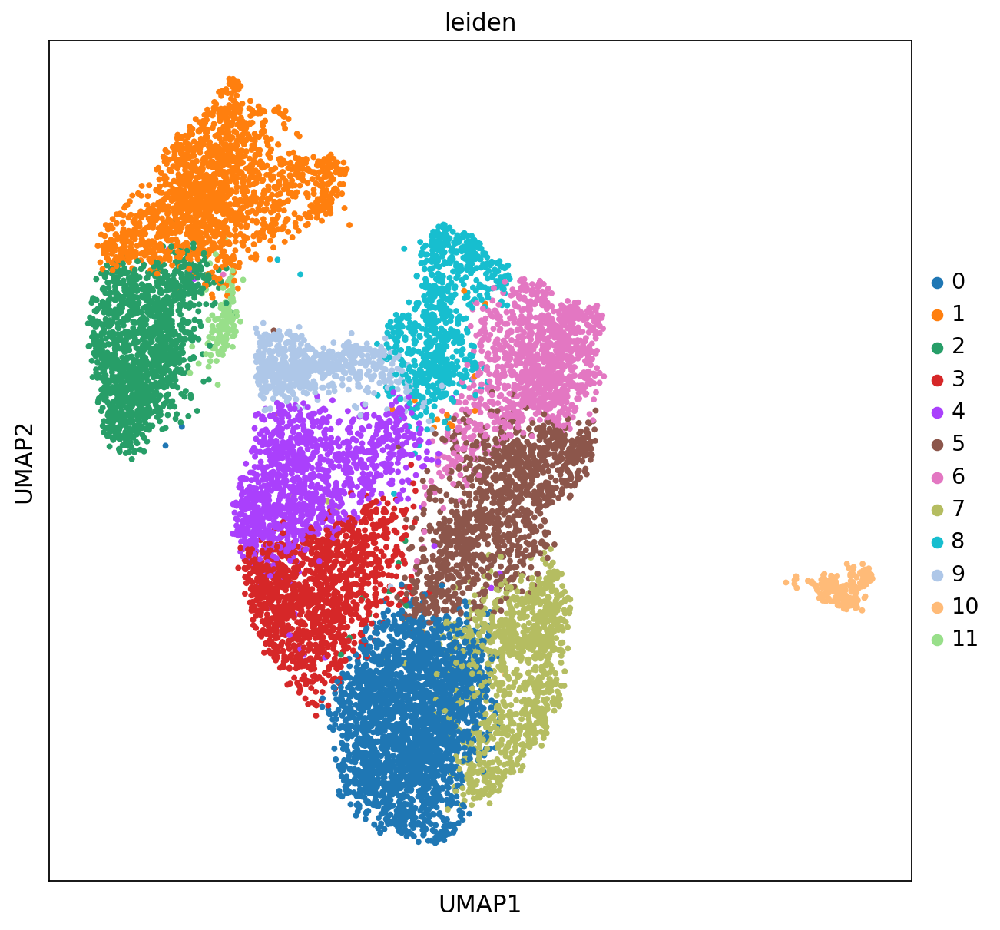

In [71]:
sc.pl.umap(rice_single_cell_slimmed_to_orthologs, color = 'leiden', s=50,)
rice_single_cell_slimmed_to_orthologs.obs['Cluster Before Gene Trimming'] =rice_single_cell_slimmed_to_orthologs.obs['leiden']

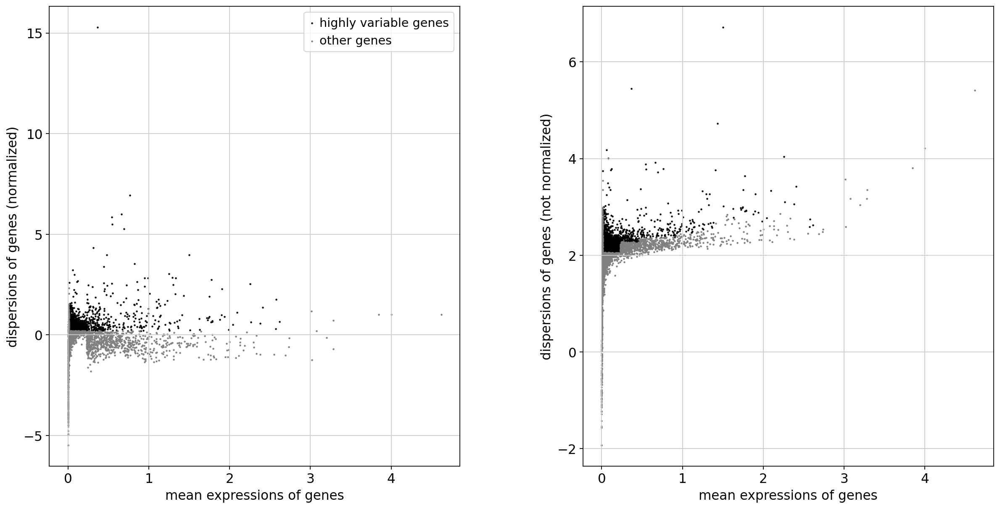

In [72]:
sc.pp.highly_variable_genes(maize_single_cell_trimmed_to_orthologs, min_mean=0.0125, max_mean=3, min_disp=.2)
sc.pl.highly_variable_genes(maize_single_cell_trimmed_to_orthologs)

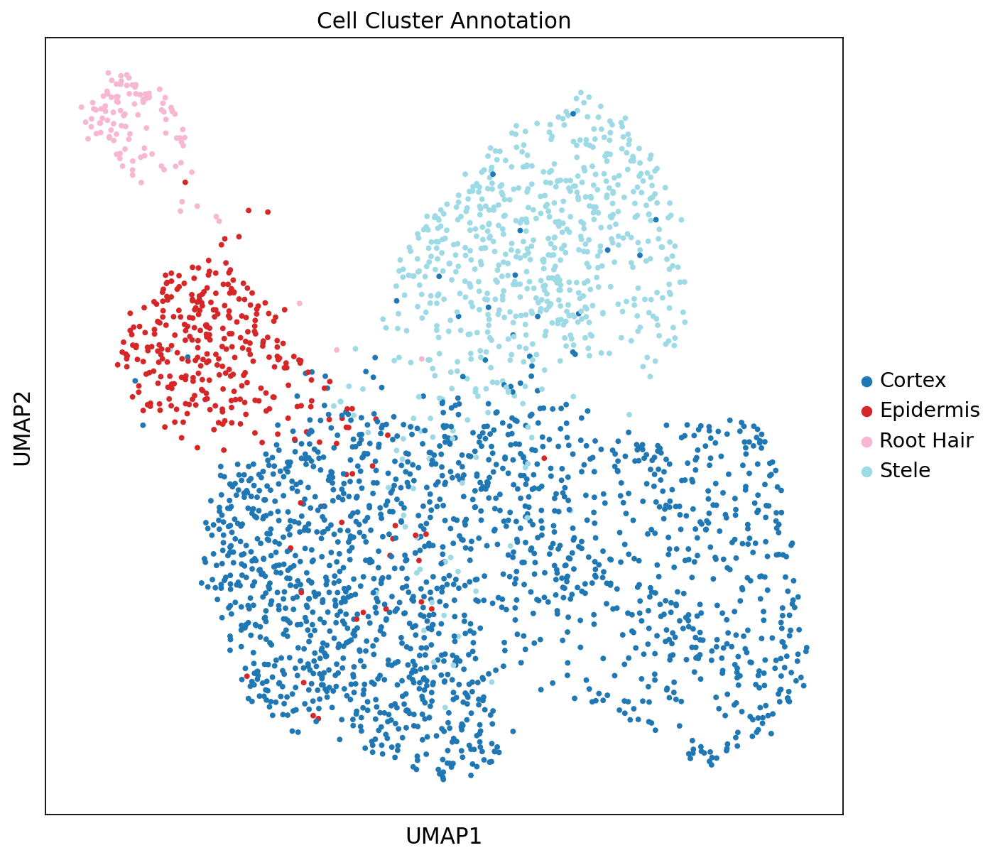

In [73]:
sc.tl.pca(maize_single_cell_trimmed_to_orthologs, svd_solver='arpack', random_state= 2435)
sc.pp.neighbors(maize_single_cell_trimmed_to_orthologs, n_neighbors=30, n_pcs=50, random_state= 68) ##30,50 # 25,45
sc.tl.umap(maize_single_cell_trimmed_to_orthologs, random_state= 253)
sc.tl.leiden(maize_single_cell_trimmed_to_orthologs, random_state= 456,)

sc.pl.umap(maize_single_cell_trimmed_to_orthologs, color = 'Cell Cluster Annotation', s=50,)

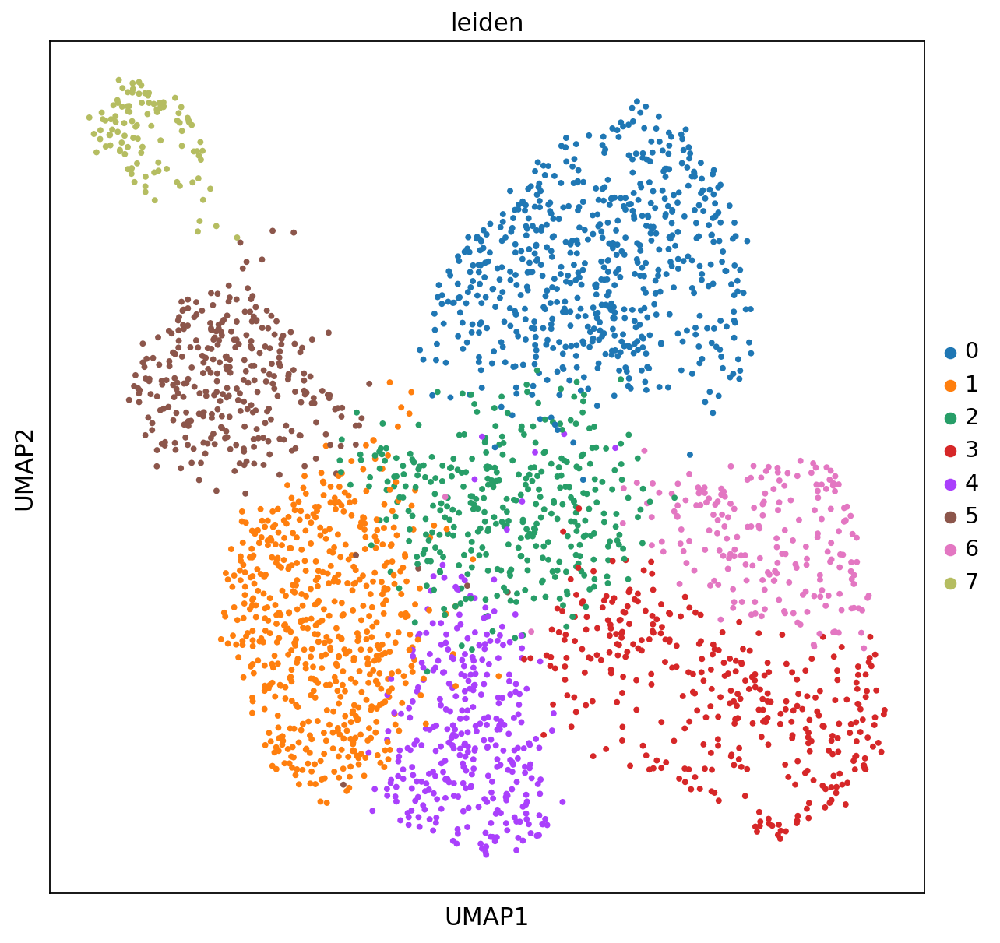

In [74]:
sc.pl.umap(maize_single_cell_trimmed_to_orthologs, color = 'leiden', s=50,)
maize_single_cell_trimmed_to_orthologs.obs['Cluster Before Gene Trimming'] =maize_single_cell_trimmed_to_orthologs.obs['leiden']

In [75]:
maize_single_cell_trimmed_to_orthologs

AnnData object with n_obs × n_vars = 2832 × 3789
    obs: 'n_genes', 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming'
    var: 'feature_types', 'In CoCoCoNet', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Rice Gene', 'Maize Gene'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
2022-07-29 14:43:00,525 - harmonypy - INFO - Iteration 1 of 10
2022-07-29 14:43:04,510 - harmonypy - INFO - Iteration 2 of 10
2022-07-29 14:43:08,572 - harmonypy - INFO - Converged after 2 iterations


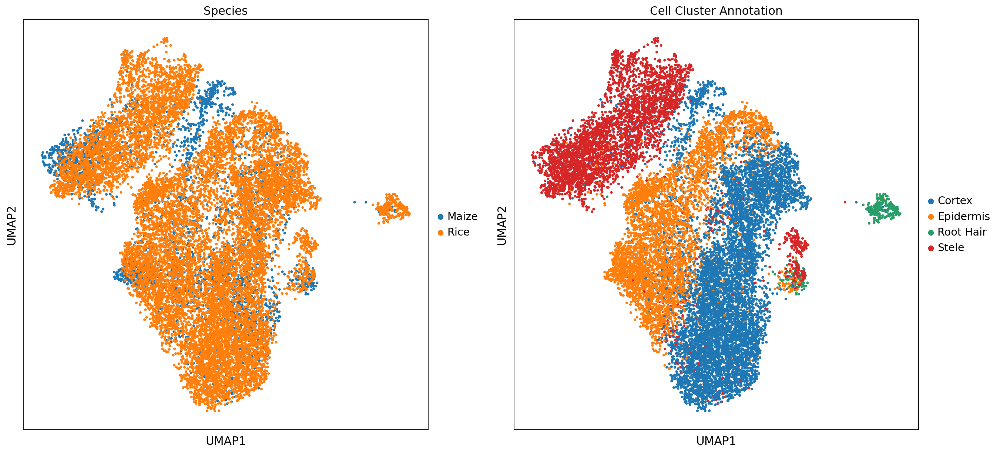

In [76]:

concatendated_rice_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(rice_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Rice'])
#sc.tl.pca(concatendated_rice_maize_dataset, svd_solver='arpack', )

sc.external.pp.harmony_integrate(concatendated_rice_maize_dataset,'Species')
sc.pp.neighbors(concatendated_rice_maize_dataset, n_neighbors = 10, n_pcs = 40, use_rep= 'X_pca_harmony', random_state = 2204)
sc.tl.umap(concatendated_rice_maize_dataset, random_state= 243)
sc.pl.umap(concatendated_rice_maize_dataset, color= ['Species', 'Cell Cluster Annotation'], s = 40,)

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


[[0.         0.94103107]
 [0.         0.        ]]
Processing datasets Maize <=> Rice


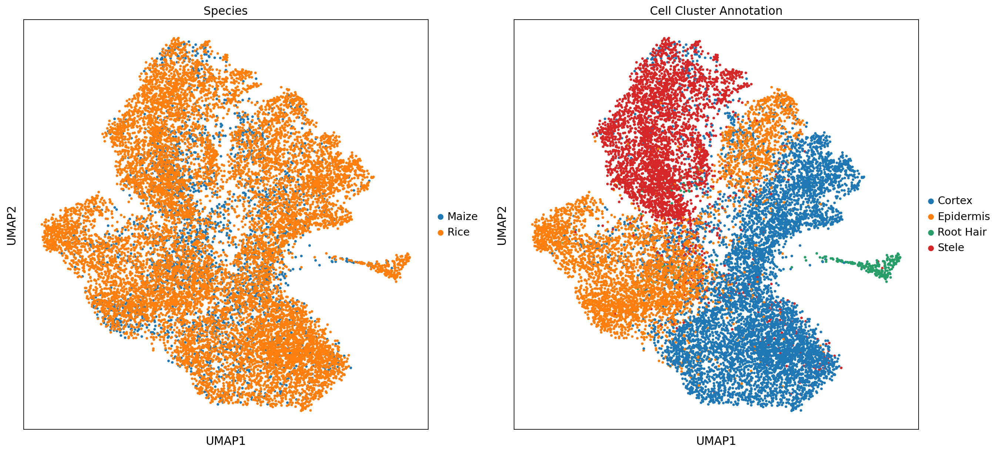

In [77]:
import scanorama
concatendated_rice_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(rice_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Rice'])
#sc.tl.pca(concatendated_rice_maize_dataset, svd_solver='arpack', )

sc.external.pp.scanorama_integrate(concatendated_rice_maize_dataset,'Species')
sc.pp.neighbors(concatendated_rice_maize_dataset, n_neighbors = 10, n_pcs = 40, use_rep= 'X_scanorama', random_state = 2204)
sc.tl.umap(concatendated_rice_maize_dataset, random_state= 243)
sc.pl.umap(concatendated_rice_maize_dataset, color= ['Species', 'Cell Cluster Annotation'], s = 40,)

In [78]:
maize_cells = concatendated_rice_maize_dataset.obs.loc[concatendated_rice_maize_dataset.obs['Species'] == 'Maize'].index
rice_cells = concatendated_rice_maize_dataset.obs.loc[concatendated_rice_maize_dataset.obs['Species'] == 'Rice'].index


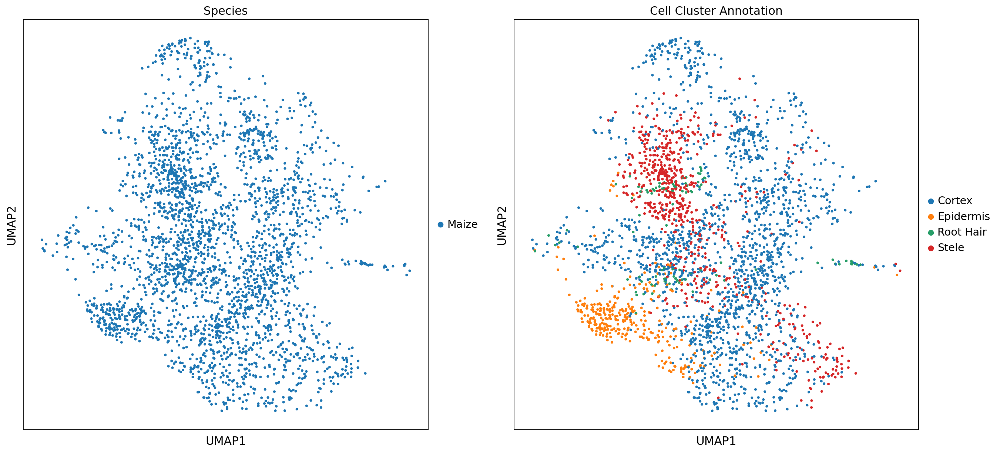

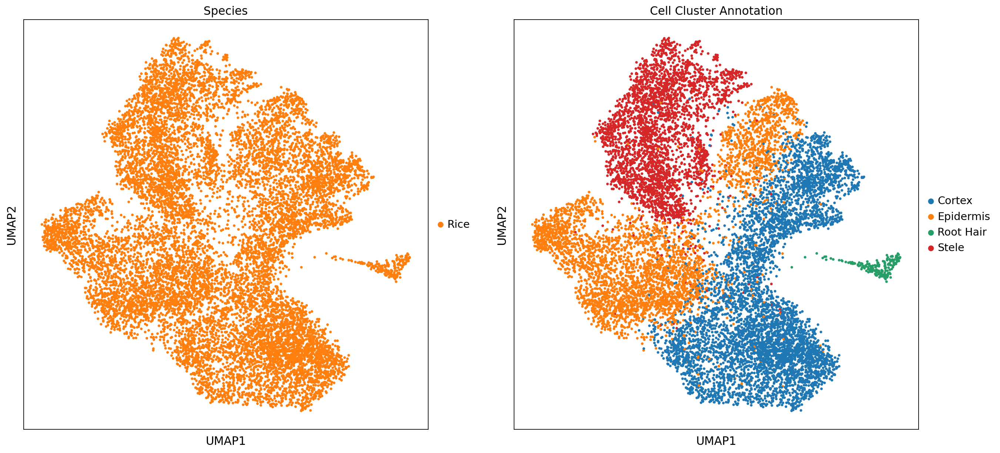

In [79]:
sc.pl.umap(concatendated_rice_maize_dataset[maize_cells,:], color= ['Species', 'Cell Cluster Annotation'], s = 40,)
sc.pl.umap(concatendated_rice_maize_dataset[rice_cells,:], color= ['Species', 'Cell Cluster Annotation'], s = 40)


In [80]:
concatendated_rice_maize_dataset[maize_cells,:].obs

,n_genes,leiden,Cell Cluster Annotation,Cluster Before Gene Trimming,Species
AAACCCAAGAAACACT-1-Maize,455.0,4,Cortex,4,Maize
AAACCCAAGAGCAGCT-1-Maize,992.0,0,Stele,0,Maize
AAACCCAGTGATCATC-1-Maize,636.0,2,Stele,2,Maize
AAACCCATCAGACCCG-1-Maize,736.0,0,Stele,0,Maize
AAACGAACATCGTGCG-1-Maize,911.0,5,Epidermis,5,Maize
...,...,...,...,...,...
TTTGGTTTCTGACAGT-1-Maize,589.0,4,Cortex,4,Maize
TTTGTTGAGAGCAGTC-1-Maize,727.0,1,Cortex,1,Maize
TTTGTTGAGTCGCCAC-1-Maize,426.0,5,Epidermis,5,Maize
TTTGTTGCATAAGATG-1-Maize,1481.0,1,Cortex,1,Maize


In [81]:
#sc.pl.umap(concatendated_rice_maize_dataset, color= ['Species', 'Cell Cluster Annotation'],palette = 'Set1', s = 60,)

In [82]:
#sc.pl.umap(concatendated_rice_maize_dataset, color= ['Species', 'leiden'], s = 40,)

In [83]:
concatendated_rice_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(rice_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Rice'])


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [84]:
import pymn


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


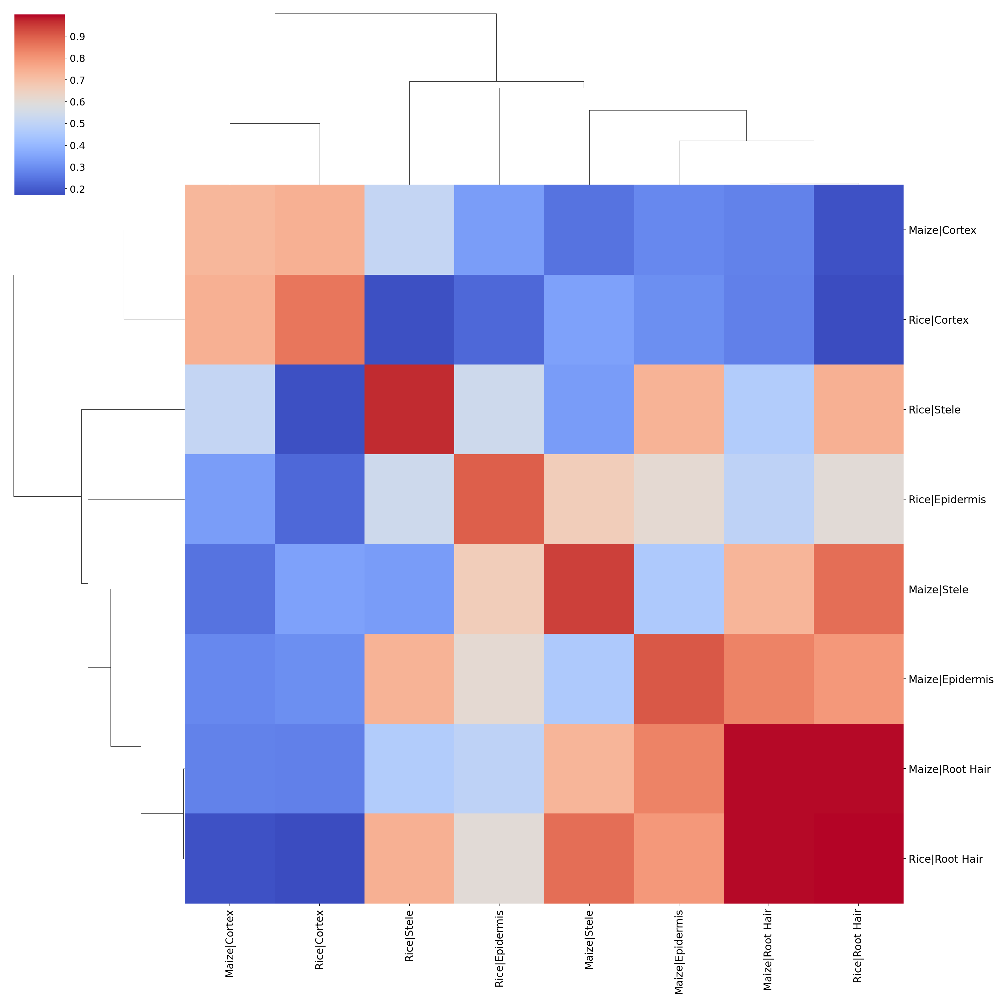

In [85]:
pymn.variableGenes(concatendated_rice_maize_dataset,study_col = 'Species')
pymn.MetaNeighborUS(concatendated_rice_maize_dataset,study_col = 'Species',ct_col = 'Cell Cluster Annotation')
g = pymn.plotMetaNeighborUS(concatendated_rice_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
#g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_proj')

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


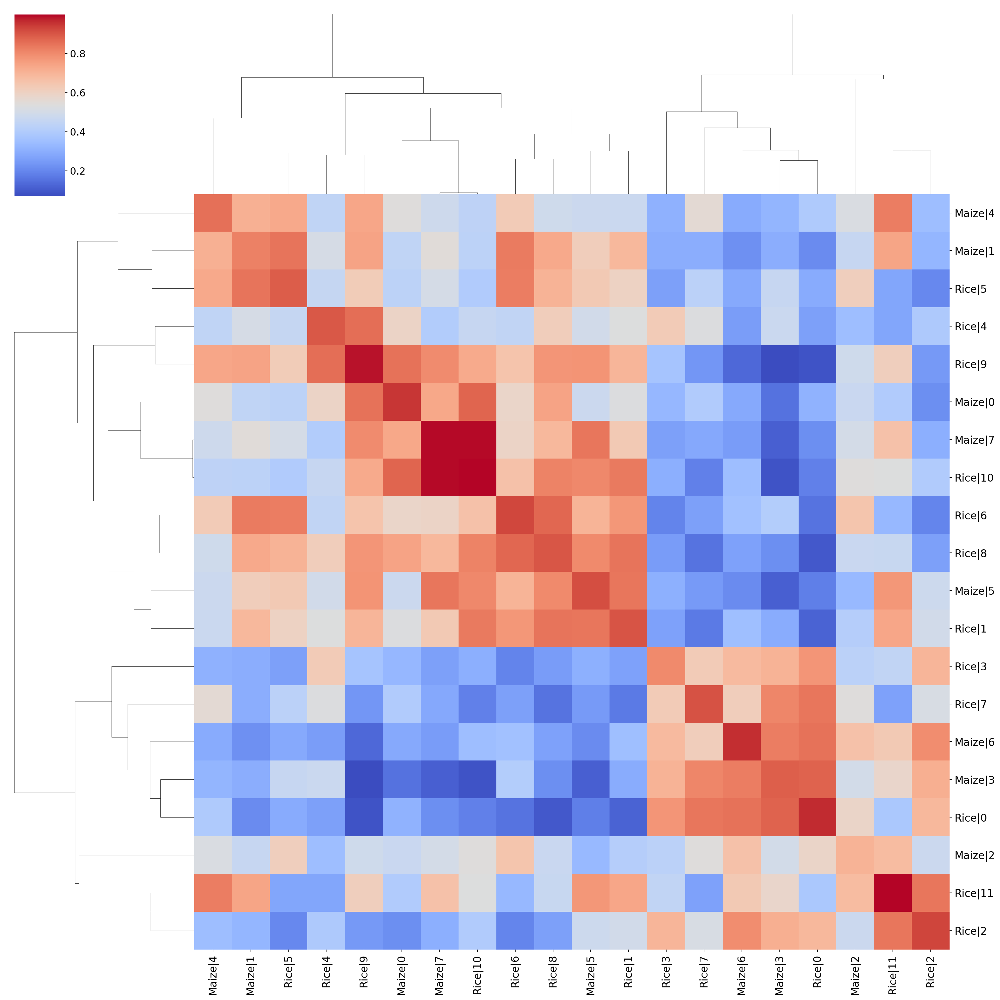

In [86]:
pymn.variableGenes(concatendated_rice_maize_dataset,study_col = 'Species')
pymn.MetaNeighborUS(concatendated_rice_maize_dataset,study_col = 'Species',ct_col = 'Cluster Before Gene Trimming')
g = pymn.plotMetaNeighborUS(concatendated_rice_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
#g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_proj')

In [87]:
concatendated_rice_maize_dataset.obs['Combined_Pre_trimming_clusters'] = concatendated_rice_maize_dataset.obs['Cluster Before Gene Trimming']

concatendated_rice_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_rice_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['1','14',]))&(concatendated_rice_maize_dataset.obs['Species'] == 'Rice')] = '1+14'
concatendated_rice_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_rice_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['6','9','8']))&(concatendated_rice_maize_dataset.obs['Species'] == 'Rice')] = '6+9+8'
concatendated_rice_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_rice_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['2','12',]))&(concatendated_rice_maize_dataset.obs['Species'] == 'Rice')] = '2+12'
concatendated_rice_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_rice_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['4','7',]))&(concatendated_rice_maize_dataset.obs['Species'] == 'Rice')] = '4+7'
concatendated_rice_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_rice_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['10','5',]))&(concatendated_rice_maize_dataset.obs['Species'] == 'Rice')] = '10+5'


concatendated_rice_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_rice_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['5','6',]))&(concatendated_rice_maize_dataset.obs['Species'] == 'Maize')] = '6+5'
concatendated_rice_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_rice_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['3','8',]))&(concatendated_rice_maize_dataset.obs['Species'] == 'Maize')] = '3+8'


/tmp/ipykernel_1988199/327746849.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  concatendated_rice_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_rice_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['1','14',]))&(concatendated_rice_maize_dataset.obs['Species'] == 'Rice')] = '1+14'
/tmp/ipykernel_1988199/327746849.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  concatendated_rice_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_rice_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['6','9','8']))&(concatendated_rice_maize_dataset.obs['Species'] == 'Ric

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


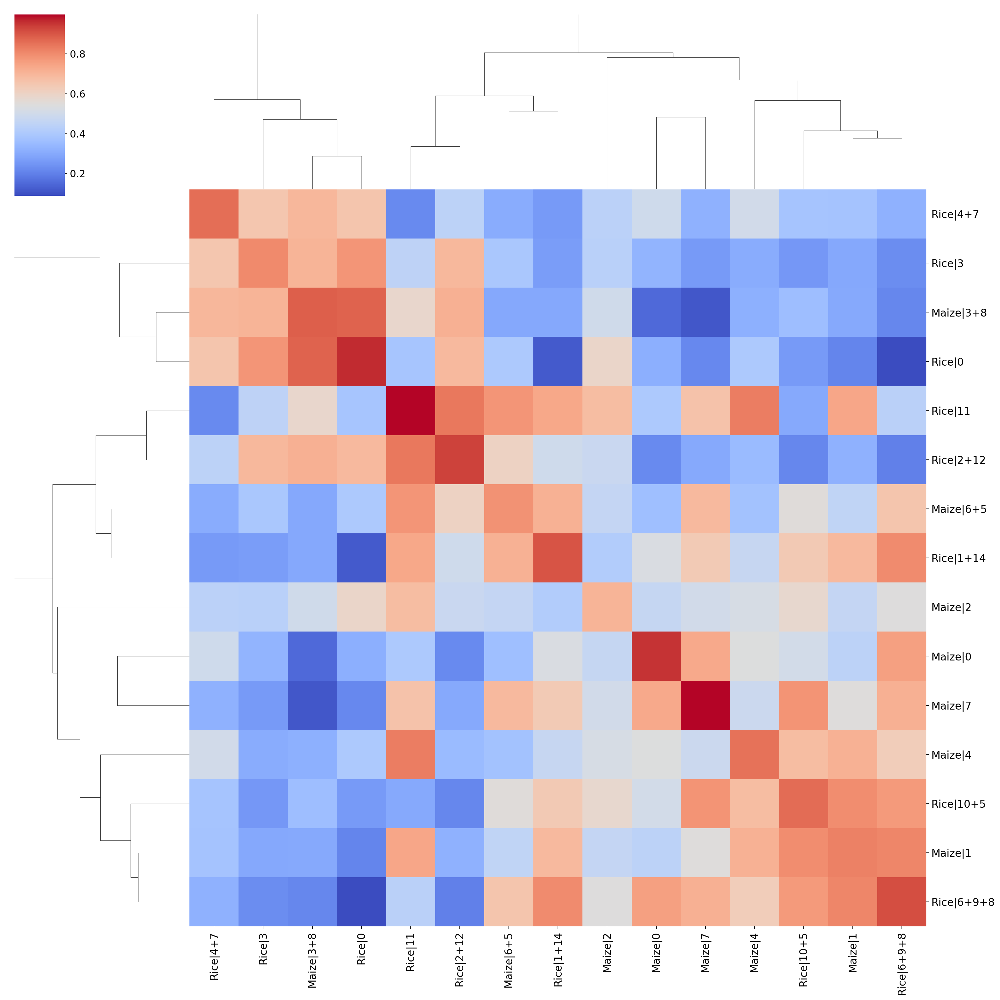

In [88]:
pymn.variableGenes(concatendated_rice_maize_dataset,study_col = 'Species')
pymn.MetaNeighborUS(concatendated_rice_maize_dataset,study_col = 'Species',ct_col = 'Combined_Pre_trimming_clusters')
g = pymn.plotMetaNeighborUS(concatendated_rice_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
#g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_proj')

In [89]:
concatendated_rice_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(rice_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Rice'])


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [90]:
sc.pp.highly_variable_genes(concatendated_rice_maize_dataset, min_mean=0.0125, max_mean=3, min_disp=0.3, batch_key = 'Species')


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)


In [91]:
var_select = concatendated_rice_maize_dataset.var.highly_variable_nbatches > 1
var_genes = var_select.index[var_select]

In [92]:
batches = concatendated_rice_maize_dataset.obs['Species'].cat.categories.tolist()
alldata = {}
for batch in batches:
    alldata[batch] = concatendated_rice_maize_dataset[concatendated_rice_maize_dataset.obs['Species'] == batch,]

alldata 

{'Maize': View of AnnData object with n_obs × n_vars = 2832 × 3789
     obs: 'n_genes', 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming', 'Species'
     var: 'feature_types', 'Rice Gene', 'Maize Gene', 'In CoCoCoNet-Maize', 'n_cells-Maize', 'highly_variable-Maize', 'means-Maize', 'dispersions-Maize', 'dispersions_norm-Maize', 'highly_variable-Rice', 'means-Rice', 'dispersions-Rice', 'dispersions_norm-Rice', 'gene_ids-Rice', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
     uns: 'hvg'
     obsm: 'X_pca', 'X_umap',
 'Rice': View of AnnData object with n_obs × n_vars = 13077 × 3789
     obs: 'n_genes', 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming', 'Species'
     var: 'feature_types', 'Rice Gene', 'Maize Gene', 'In CoCoCoNet-Maize', 'n_cells-Maize', 'highly_variable-Maize', 'means-Maize', 'dispersions-Maize', 'dispersions_norm-Maize', 'highly_variable-Rice', 'means-Rice', 

In [93]:
concatendated_rice_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(rice_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Rice'])


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [94]:
cdata = sc.external.pp.mnn_correct(alldata['Maize'],alldata['Rice'],
                                   svd_dim = 50, batch_key = 'sample', save_raw = True, var_subset = var_genes)

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/mnnpy/utils.py:30: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float32, 1d, A), array(float32, 1d, A))
  dist[i, j] = np.dot(m[i], n[j])
/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/mnnpy/utils.py:205: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float32, 1d, C), array(float32, 1d, A))
  scale = np.dot(working, grad)
/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/mnnpy/utils.py:215: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float32, 1d, C), array(float32, 1d, A))
  curproj = np.dot(grad, curcell)


Performing cosine normalization...
Starting MNN correct iteration. Reference batch: 0
Step 1 of 1: processing batch 1
  Looking for MNNs...
  Computing correction vectors...
  Removing components...
  Adjusting variance...
  Applying correction...
MNN correction complete. Gathering output...
Packing AnnData object...
Done.


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [95]:
corr_data = cdata[0]

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


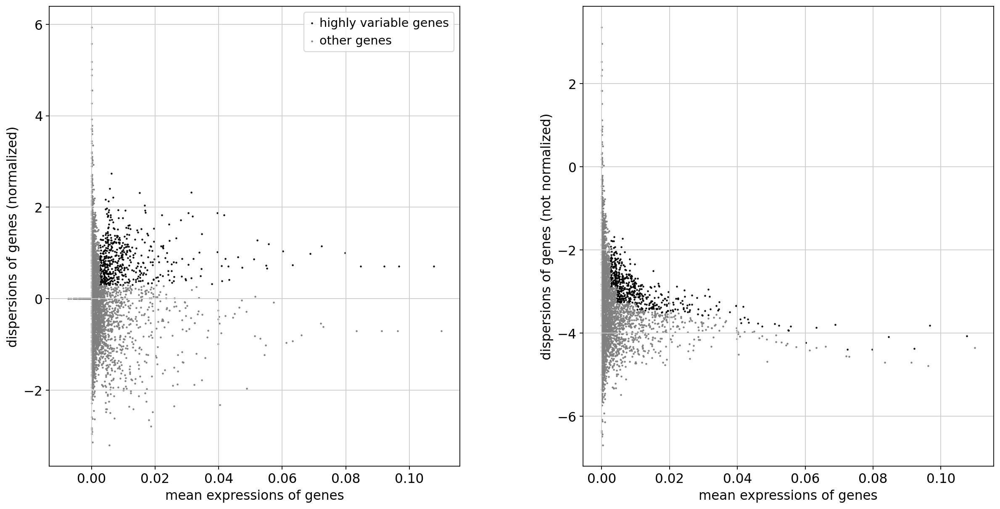

In [96]:
sc.pp.highly_variable_genes(corr_data, min_mean=0.0025, max_mean=3, min_disp=0.3)
sc.pl.highly_variable_genes(corr_data)

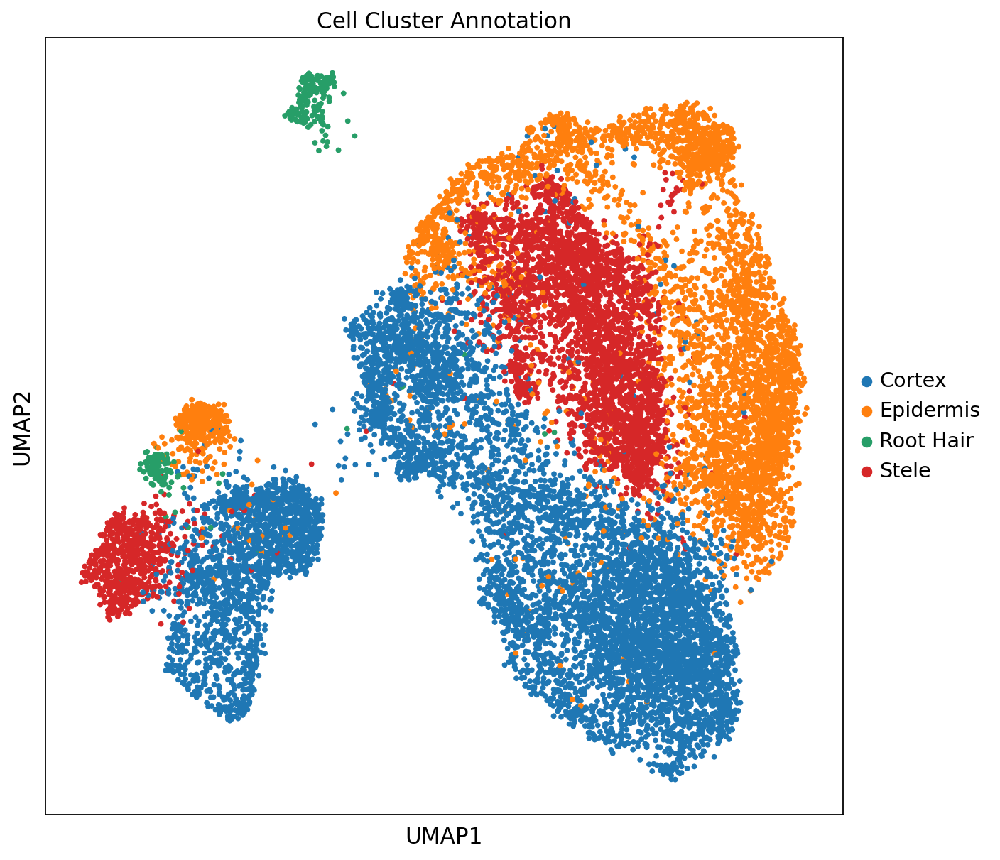

In [97]:
sc.tl.pca(corr_data, svd_solver='arpack', random_state= 243)
sc.pp.neighbors(corr_data, n_neighbors=30, n_pcs=50, random_state= 647) ##30,50 # 25,45
sc.tl.umap(corr_data, random_state= 2)
sc.tl.leiden(corr_data, random_state= 423,)

sc.pl.umap(corr_data, color = 'Cell Cluster Annotation', s=50,)

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


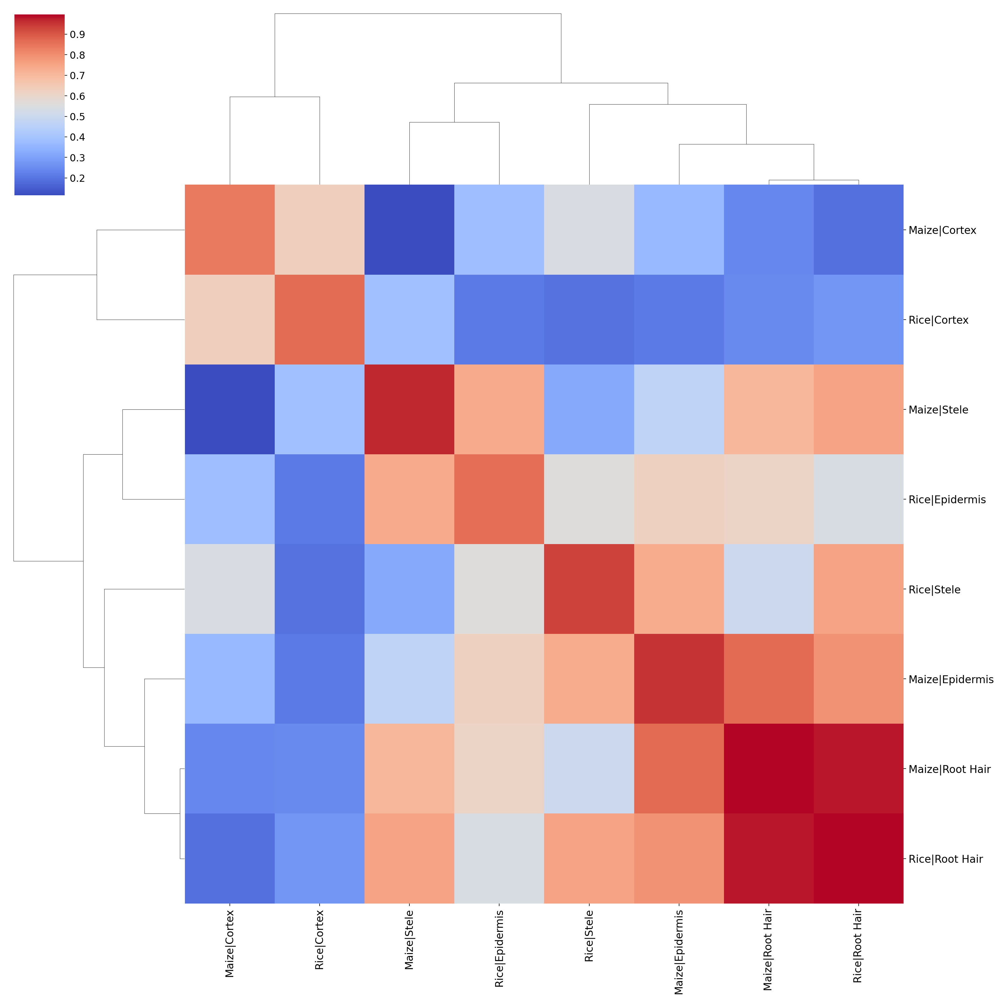

In [98]:
pymn.variableGenes(corr_data,study_col = 'Species')
pymn.MetaNeighborUS(corr_data,study_col = 'Species',ct_col = 'Cell Cluster Annotation')
g = pymn.plotMetaNeighborUS(corr_data,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
#g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_proj')

In [99]:
concatendated_rice_maize_dataset.obs

,n_genes,leiden,Cell Cluster Annotation,Cluster Before Gene Trimming,Species
AAACCCAAGAAACACT-1-Maize,455.0,4,Cortex,4,Maize
AAACCCAAGAGCAGCT-1-Maize,992.0,0,Stele,0,Maize
AAACCCAGTGATCATC-1-Maize,636.0,2,Stele,2,Maize
AAACCCATCAGACCCG-1-Maize,736.0,0,Stele,0,Maize
AAACGAACATCGTGCG-1-Maize,911.0,5,Epidermis,5,Maize
...,...,...,...,...,...
TTTGTCATCAAACCAC-1-Rice,NaN,9,Epidermis,9,Rice
TTTGTCATCATTGCCC-1-Rice,NaN,6,Cortex,6,Rice
TTTGTCATCCCTTGTG-1-Rice,NaN,0,Cortex,0,Rice
TTTGTCATCGGTCCGA-1-Rice,NaN,1,Stele,1,Rice


In [100]:
import scgen

Global seed set to 0
/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/chex/_src/pytypes.py:37: FutureWarning: jax.tree_structure is deprecated, and will be removed in a future release. Use jax.tree_util.tree_structure instead.
  PyTreeDef = type(jax.tree_structure(None))


In [101]:
scgen.SCGEN.setup_anndata(concatendated_rice_maize_dataset, batch_key="Species", labels_key="Cell Cluster Annotation")


In [102]:
model = scgen.SCGEN(concatendated_rice_maize_dataset)

In [103]:
model.train(
    max_epochs=100,
    batch_size=32,
    early_stopping=True,
    early_stopping_patience=25,
)

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/scvi/model/base/_training_mixin.py:67: UserWarning: max_epochs=100 is less than n_epochs_kl_warmup=400. The max_kl_weight will not be reached during training.
  warnings.warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 27/100:  27%|██▋       | 27/100 [04:33<12:20, 10.15s/it, loss=230, v_num=1]
Monitored metric elbo_validation did not improve in the last 25 records. Best score: 1270.276. Signaling Trainer to stop.


In [104]:
corrected_adata = model.batch_removal()
corrected_adata

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       


AnnData object with n_obs × n_vars = 15909 × 3789
    obs: 'n_genes', 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming', 'Species', '_scvi_batch', '_scvi_labels'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'latent', 'corrected_latent'

         Falling back to preprocessing with `sc.pp.pca` and default params.


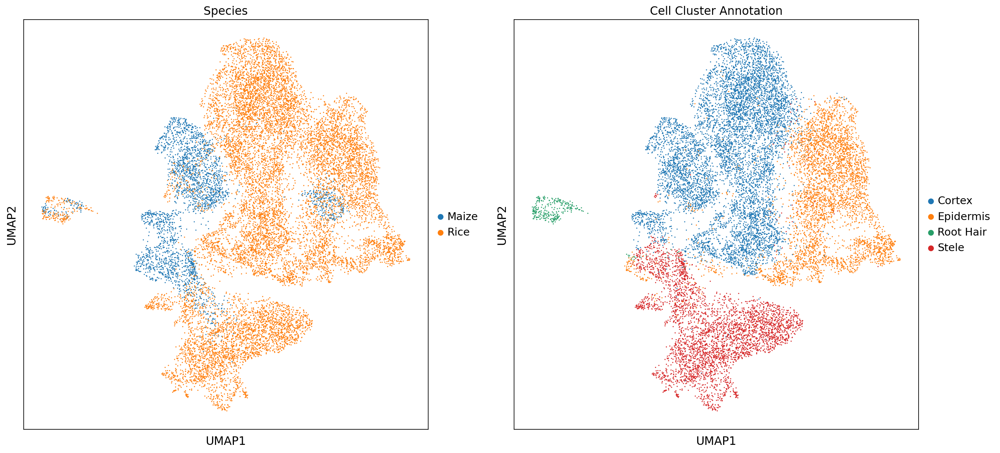

In [105]:
sc.pp.neighbors(corrected_adata)
sc.tl.umap(corrected_adata)
sc.pl.umap(corrected_adata, color=['Species', 'Cell Cluster Annotation'])

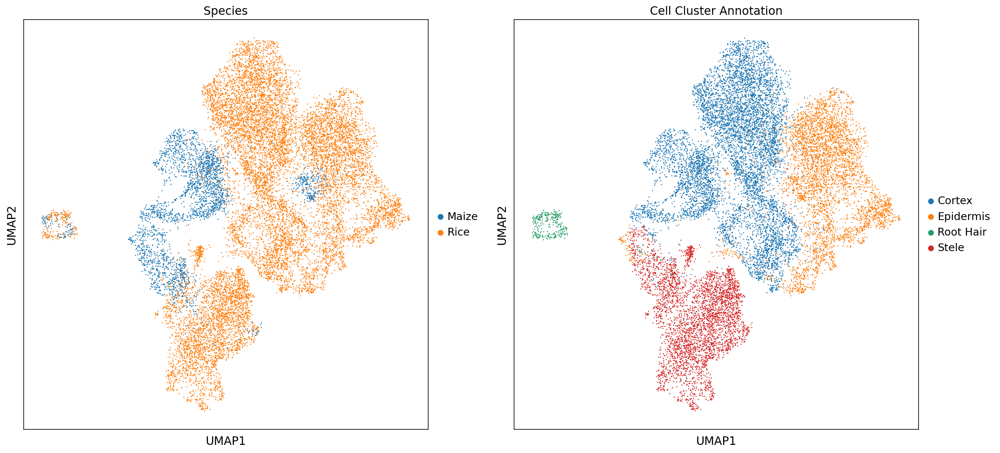

In [106]:
sc.pp.neighbors(corrected_adata, use_rep="corrected_latent")
sc.tl.umap(corrected_adata)
sc.pl.umap(corrected_adata, color=['Species', 'Cell Cluster Annotation'])

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


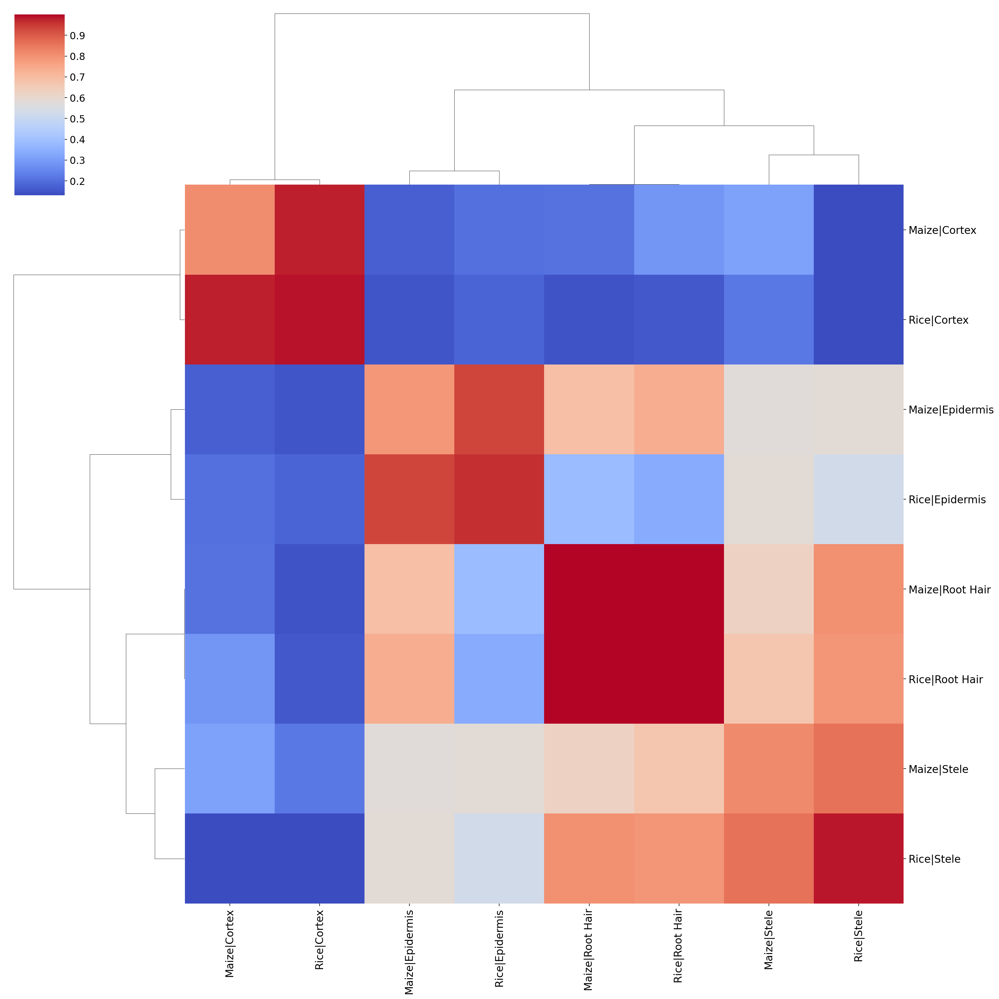

In [107]:
pymn.variableGenes(corrected_adata,study_col = 'Species')
pymn.MetaNeighborUS(corrected_adata,study_col = 'Species',ct_col = 'Cell Cluster Annotation')
g = pymn.plotMetaNeighborUS(corrected_adata,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)